In [1]:
# If you're working on features, switch main to the branch you're working on
!git clone -b main https://github.com/SamuelMoor-Smith/road-segmentation.git

Cloning into 'road-segmentation'...
remote: Enumerating objects: 529, done.
remote: Counting objects: 100% (44/44), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 529 (delta 19), reused 32 (delta 9), pack-reused 485
Receiving objects: 100% (529/529), 123.65 MiB | 11.56 MiB/s, done.
Resolving deltas: 100% (28/28), done.


In [2]:
%cd road-segmentation

/content/road-segmentation


In [3]:
!ls

CIL_Training_Example_for_Colab.ipynb  models		submission_to_mask.py
data				      postprocess	submit.py
exploration			      preprocess	train.py
__init__.py			      README.md		utils.py
mask_to_submission.py		      requirements.txt
model_checkpoints		      submissions


In [4]:
import torch
from torch import nn
from data.dataset import ImageDataset, load_all_from_path
from models.UNet_provided import UNet
from utils import train, accuracy_fn, patch_accuracy_fn
from submit import create_submission

In [5]:
data_dir = 'data/training'

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [10]:
# Can change random state and test size, important that they are the same for both dataset though
random_state = 42
test_size = 0.2

In [11]:
train_dataset = ImageDataset(data_dir, is_train=True, device=device, use_patches=False, resize_to=(384, 384), test_size=test_size, random_state=random_state)
val_dataset = ImageDataset(data_dir, is_train=False, device=device, use_patches=False, resize_to=(384, 384), test_size=test_size, random_state=random_state)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=4, shuffle=True)

In [12]:
model = UNet().to(device)
loss_fn = nn.BCELoss()
metric_fns = {'acc': accuracy_fn, 'patch_acc': patch_accuracy_fn}
optimizer = torch.optim.Adam(model.parameters())
n_epochs = 20

Epoch 1/20: 100%|██████████| 36/36 [00:20<00:00,  1.78it/s, loss=0.441, acc=0.803, patch_acc=0.693]


	- loss = 0.440629447499911
  	- val_loss = 0.47314417362213135
  	- acc = 0.8027591837777032
  	- val_acc = 0.8729790449142456
  	- patch_acc = 0.692676191114717
  	- val_patch_acc = 0.3524305522441864
 


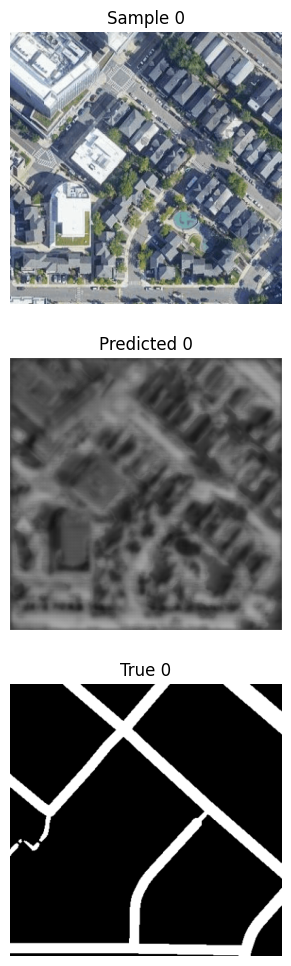

Epoch 2/20: 100%|██████████| 36/36 [00:18<00:00,  1.90it/s, loss=0.375, acc=0.842, patch_acc=0.79]


	- loss = 0.37486040426625145
  	- val_loss = 0.32413187623023987
  	- acc = 0.8423637830548816
  	- val_acc = 0.8784518837928772
  	- patch_acc = 0.7899908473094305
  	- val_patch_acc = 0.741319477558136
 


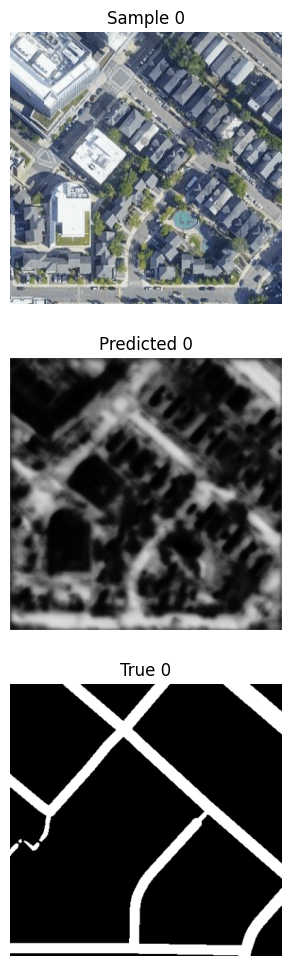

Epoch 3/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.357, acc=0.842, patch_acc=0.798]


	- loss = 0.3573693401283688
  	- val_loss = 0.26640045642852783
  	- acc = 0.8424909677770402
  	- val_acc = 0.8933037519454956
  	- patch_acc = 0.7975863350762261
  	- val_patch_acc = 0.875
 


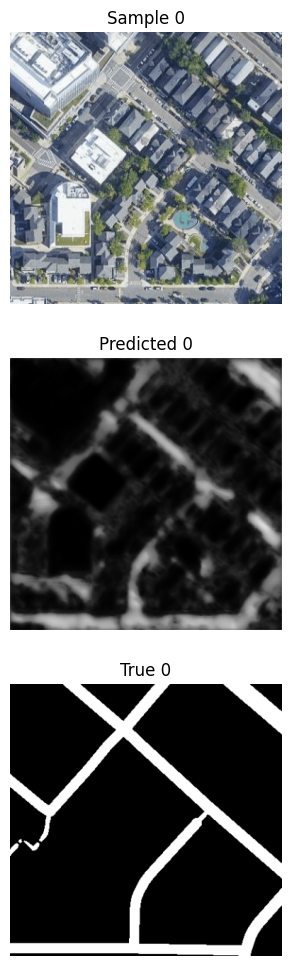

Epoch 4/20: 100%|██████████| 36/36 [00:20<00:00,  1.78it/s, loss=0.356, acc=0.848, patch_acc=0.803]


	- loss = 0.35621094289753175
  	- val_loss = 0.3106401860713959
  	- acc = 0.8477395325899124
  	- val_acc = 0.8762885332107544
  	- patch_acc = 0.8027986801332898
  	- val_patch_acc = 0.8489583134651184
 


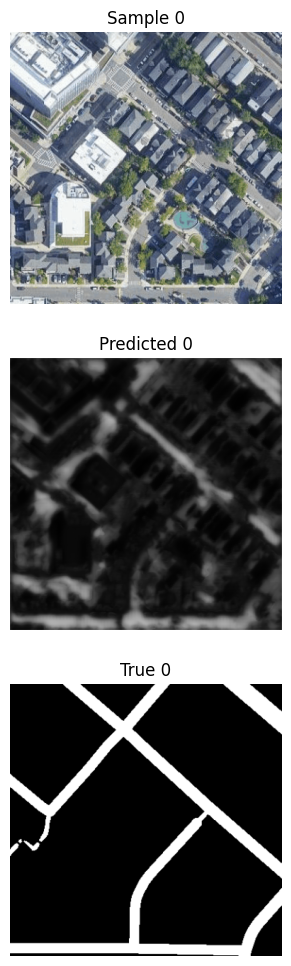

Epoch 5/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.35, acc=0.844, patch_acc=0.801]


	- loss = 0.3498307648632262
  	- val_loss = 0.3138861656188965
  	- acc = 0.8444677723778619
  	- val_acc = 0.8770887851715088
  	- patch_acc = 0.8012393977906969
  	- val_patch_acc = 0.8489583134651184
 


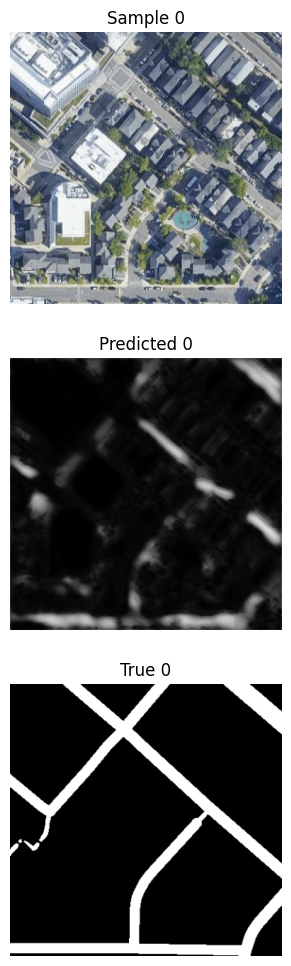

Epoch 6/20: 100%|██████████| 36/36 [00:19<00:00,  1.85it/s, loss=0.337, acc=0.854, patch_acc=0.811]


	- loss = 0.33735911548137665
  	- val_loss = 0.2585877478122711
  	- acc = 0.8543877982430987
  	- val_acc = 0.894334614276886
  	- patch_acc = 0.8113586770163642
  	- val_patch_acc = 0.8732638955116272
 


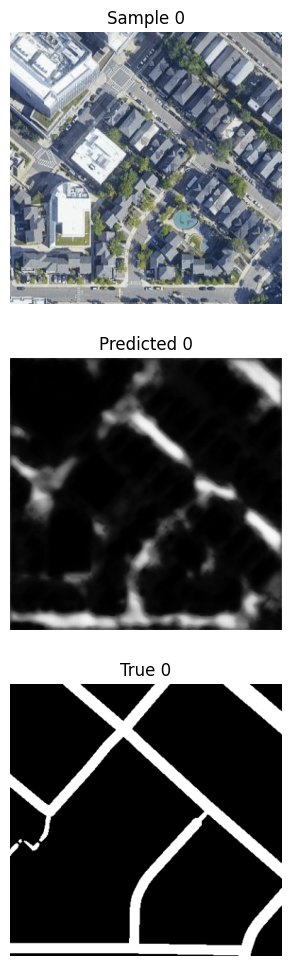

Epoch 7/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.328, acc=0.86, patch_acc=0.822]


	- loss = 0.32787710469630027
  	- val_loss = 0.27820008993148804
  	- acc = 0.8601341628366046
  	- val_acc = 0.89361572265625
  	- patch_acc = 0.8223058200544782
  	- val_patch_acc = 0.7986111044883728
 


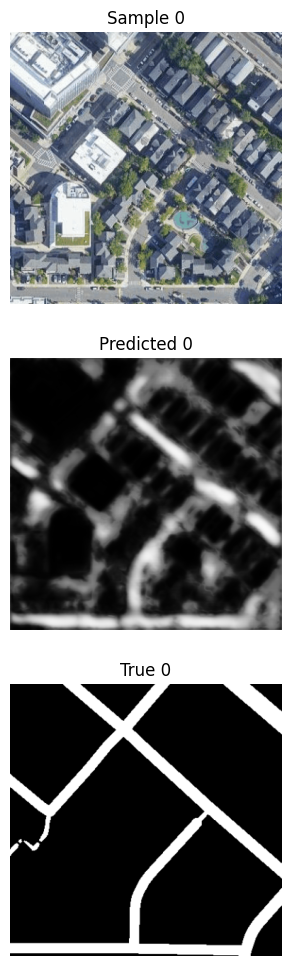

Epoch 8/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.317, acc=0.864, patch_acc=0.826]


	- loss = 0.3165393927031093
  	- val_loss = 0.24216951429843903
  	- acc = 0.8642883830600314
  	- val_acc = 0.902269184589386
  	- patch_acc = 0.8264893657631345
  	- val_patch_acc = 0.8784722089767456
 


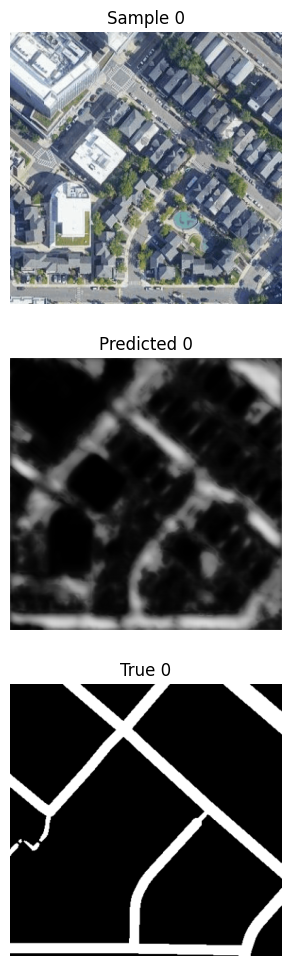

Epoch 9/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.321, acc=0.864, patch_acc=0.825]


	- loss = 0.32130856936176616
  	- val_loss = 0.2761404812335968
  	- acc = 0.8637966960668564
  	- val_acc = 0.8871392011642456
  	- patch_acc = 0.825255595975452
  	- val_patch_acc = 0.828125
 


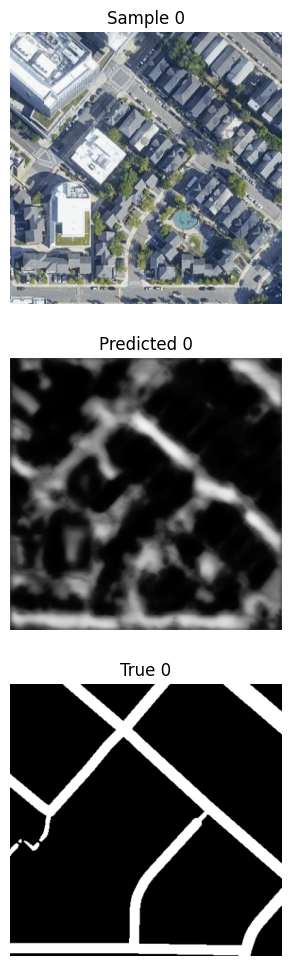

Epoch 10/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.308, acc=0.869, patch_acc=0.834]


	- loss = 0.3081146731144852
  	- val_loss = 0.25216948986053467
  	- acc = 0.8689299126466116
  	- val_acc = 0.8989800214767456
  	- patch_acc = 0.8340004566642973
  	- val_patch_acc = 0.8524305820465088
 


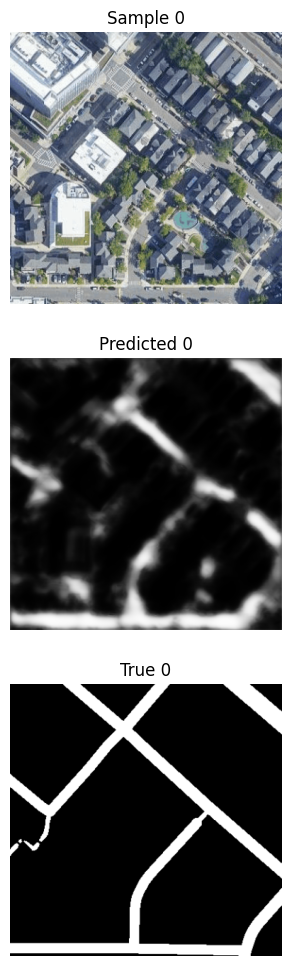

Epoch 11/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.307, acc=0.869, patch_acc=0.838]


	- loss = 0.30745909238855046
  	- val_loss = 0.2525300979614258
  	- acc = 0.8691048721472422
  	- val_acc = 0.889451801776886
  	- patch_acc = 0.8376294142670102
  	- val_patch_acc = 0.8784722089767456
 


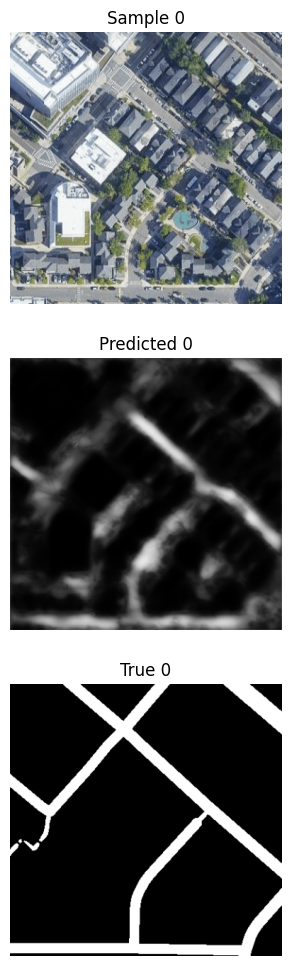

Epoch 12/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.29, acc=0.879, patch_acc=0.847]


	- loss = 0.28992269477910465
  	- val_loss = 0.25258541107177734
  	- acc = 0.8785728845331404
  	- val_acc = 0.8945041298866272
  	- patch_acc = 0.8467239042123159
  	- val_patch_acc = 0.828125
 


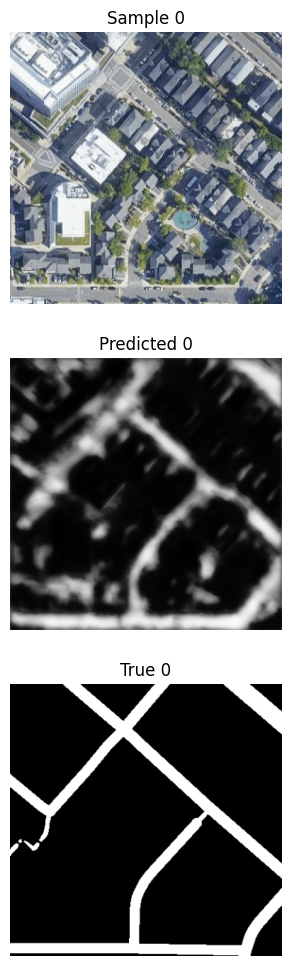

Epoch 13/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.284, acc=0.882, patch_acc=0.853]


	- loss = 0.2844173324604829
  	- val_loss = 0.19460450112819672
  	- acc = 0.8824333796898524
  	- val_acc = 0.923631489276886
  	- patch_acc = 0.8526516010363897
  	- val_patch_acc = 0.9184027910232544
 


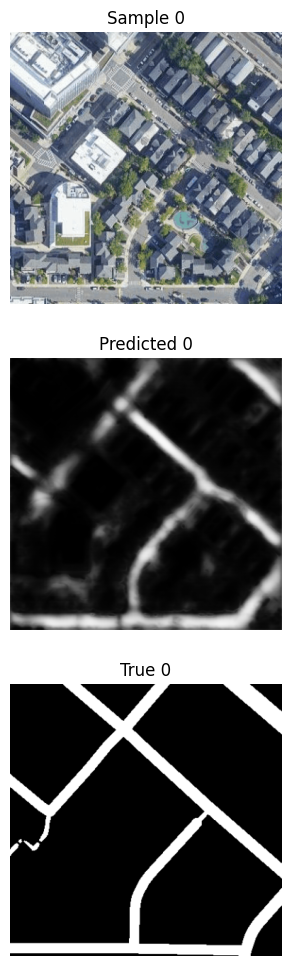

Epoch 14/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.279, acc=0.884, patch_acc=0.858]


	- loss = 0.2790160845551226
  	- val_loss = 0.23134909570217133
  	- acc = 0.8842314746644762
  	- val_acc = 0.9056396484375
  	- patch_acc = 0.8580729249450896
  	- val_patch_acc = 0.9010416865348816
 


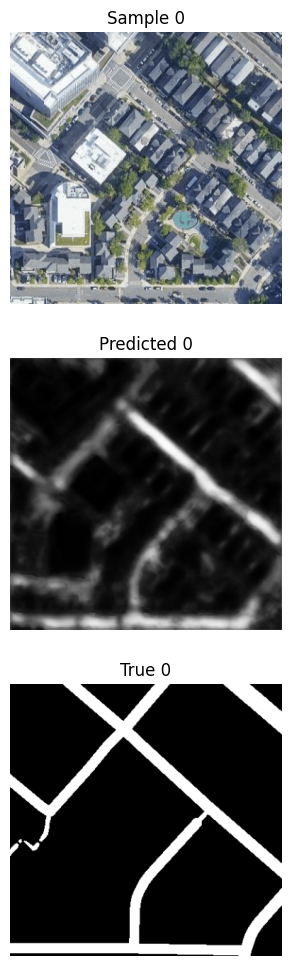

Epoch 15/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.272, acc=0.887, patch_acc=0.855]


	- loss = 0.2724205031991005
  	- val_loss = 0.1801212579011917
  	- acc = 0.8868559764491187
  	- val_acc = 0.93536376953125
  	- patch_acc = 0.8550789323117998
  	- val_patch_acc = 0.9166666865348816
 


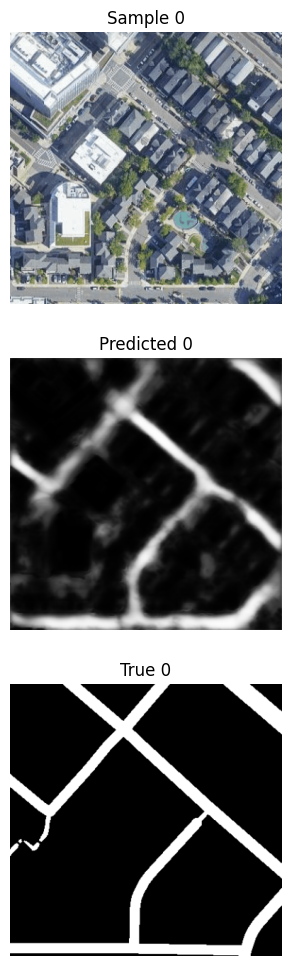

Epoch 16/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.253, acc=0.895, patch_acc=0.87]


	- loss = 0.25281308508581585
  	- val_loss = 0.18844744563102722
  	- acc = 0.8948481265041563
  	- val_acc = 0.9303520917892456
  	- patch_acc = 0.86953447593583
  	- val_patch_acc = 0.8923611044883728
 


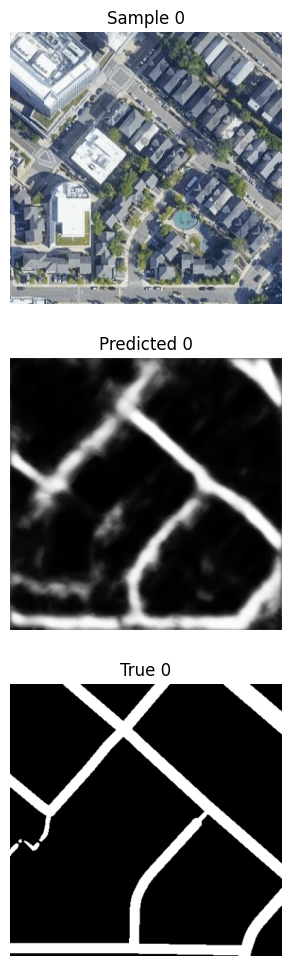

Epoch 17/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.246, acc=0.9, patch_acc=0.879]


	- loss = 0.24585363061891663
  	- val_loss = 0.18840311467647552
  	- acc = 0.8996337685320113
  	- val_acc = 0.9225599765777588
  	- patch_acc = 0.8786410192648569
  	- val_patch_acc = 0.9236111044883728
 


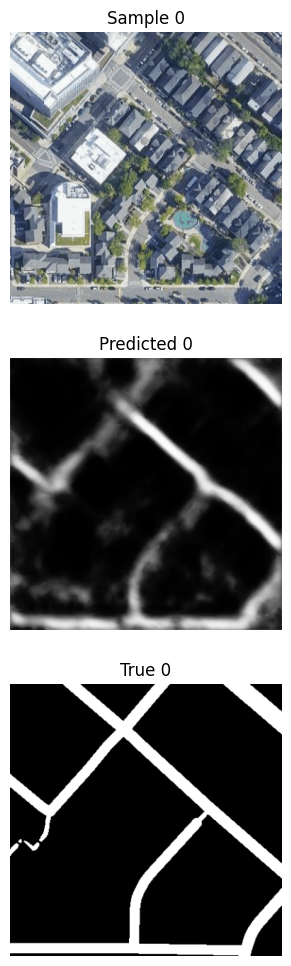

Epoch 18/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.246, acc=0.9, patch_acc=0.876]


	- loss = 0.24576476878590053
  	- val_loss = 0.15988299250602722
  	- acc = 0.8996627827485403
  	- val_acc = 0.9377848505973816
  	- patch_acc = 0.8764306902885437
  	- val_patch_acc = 0.9322916865348816
 


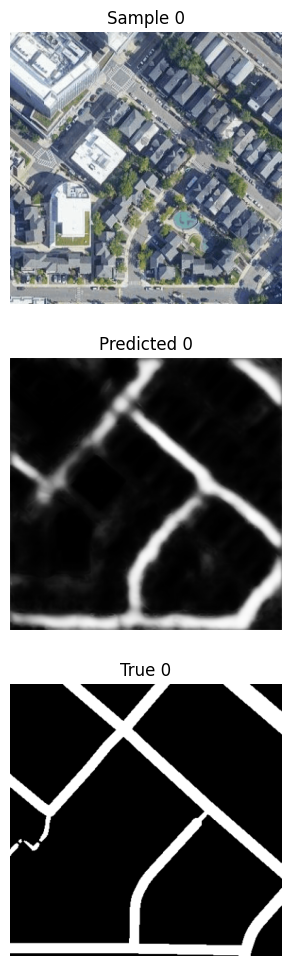

Epoch 19/20: 100%|██████████| 36/36 [00:19<00:00,  1.83it/s, loss=0.239, acc=0.902, patch_acc=0.879]


	- loss = 0.23942024384935698
  	- val_loss = 0.1999480277299881
  	- acc = 0.9023998181025187
  	- val_acc = 0.9239162802696228
  	- patch_acc = 0.8790951387749778
  	- val_patch_acc = 0.8923611044883728
 


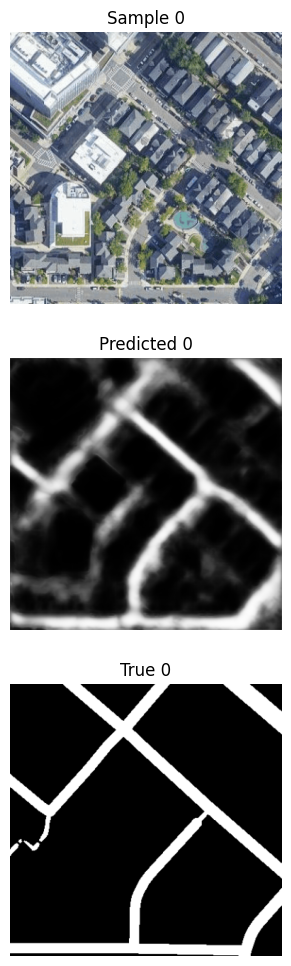

Epoch 20/20: 100%|██████████| 36/36 [00:19<00:00,  1.82it/s, loss=0.236, acc=0.905, patch_acc=0.881]


	- loss = 0.23609857592317793
  	- val_loss = 0.1805540919303894
  	- acc = 0.9050609668095907
  	- val_acc = 0.9313490390777588
  	- patch_acc = 0.8808995650874244
  	- val_patch_acc = 0.8836805820465088
 


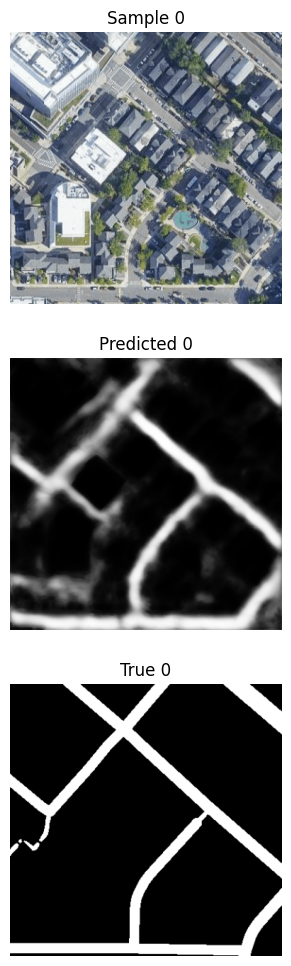

Finished Training


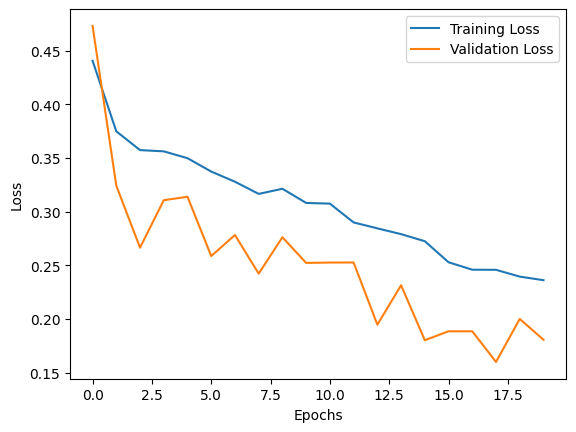

In [13]:
train(train_dataloader, val_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs, name='20_epochs_baseline')

In [10]:
%load_ext tensorboard
%tensorboard --logdir ./tensorboard

<IPython.core.display.Javascript object>

In [14]:
create_submission(submission_filename='unet_submission_only_1_val_img.csv', model=model, device=device)